Sign Detect

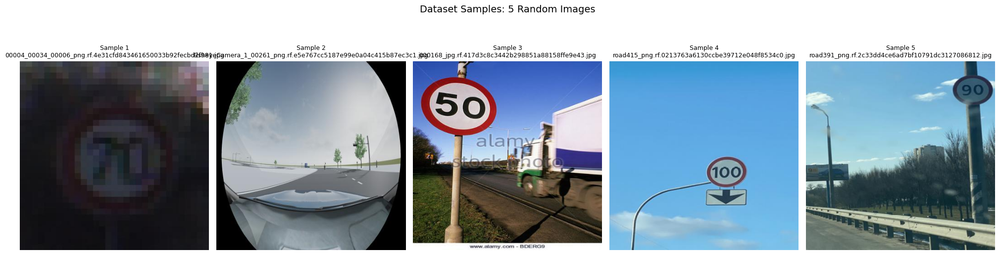

In [5]:
import cv2
import matplotlib.pyplot as plt
import os
import glob
import random

def visualize_samples(data_root, num_samples=5):
    """
    Picks random training images to inspect data quality and variance.
    """
    # Target the training directory specifically
    train_path = os.path.join(data_root, "car", "train")
    
    # Fallback to root if specific structure doesn't exist
    if not os.path.exists(train_path):
        train_path = data_root

    # Grab all image files recursively
    extensions = ["*.jpg", "*.png", "*.jpeg"]
    img_files = []
    for ext in extensions:
        img_files.extend(glob.glob(os.path.join(train_path, "**", ext), recursive=True))

    if not img_files:
        print(f"No images found in {train_path}")
        return

    # Select random samples
    samples = random.sample(img_files, min(len(img_files), num_samples))

    # Setup plot
    plt.figure(figsize=(20, 6))
    plt.suptitle(f"Dataset Samples: {len(samples)} Random Images", fontsize=14)

    for i, img_path in enumerate(samples):
        # Read and convert BGR to RGB for plotting
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"Sample {i+1}\n{os.path.basename(img_path)}", fontsize=9)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Adjust this path to your local dataset location
    dataset_dir = "signdata" 
    visualize_samples(dataset_dir)

--- Running Stage 1: Baseline (Your Pipeline / Octagon Error) ---


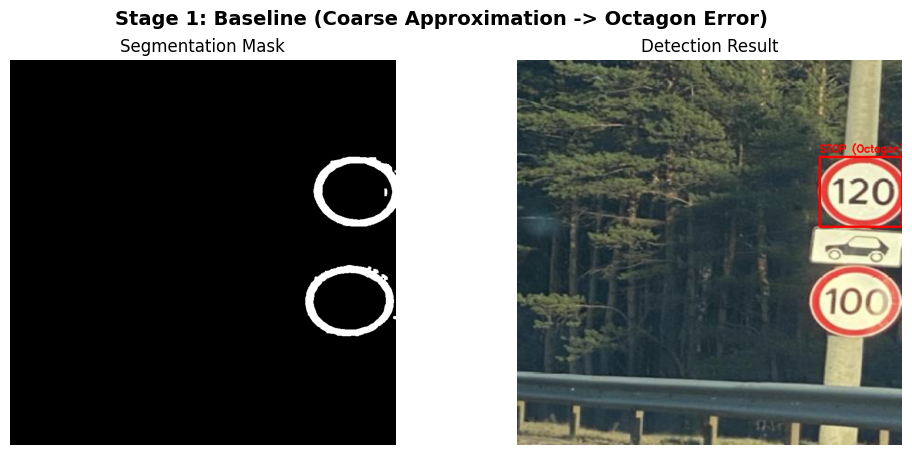

--- Running Stage 2: Geometric Refinement ---


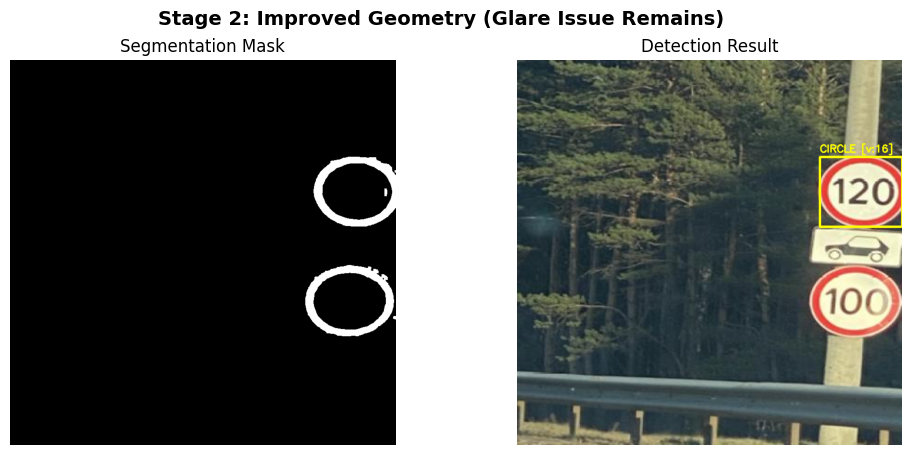

--- Running Stage 3: Final Anti-Glare Solution ---


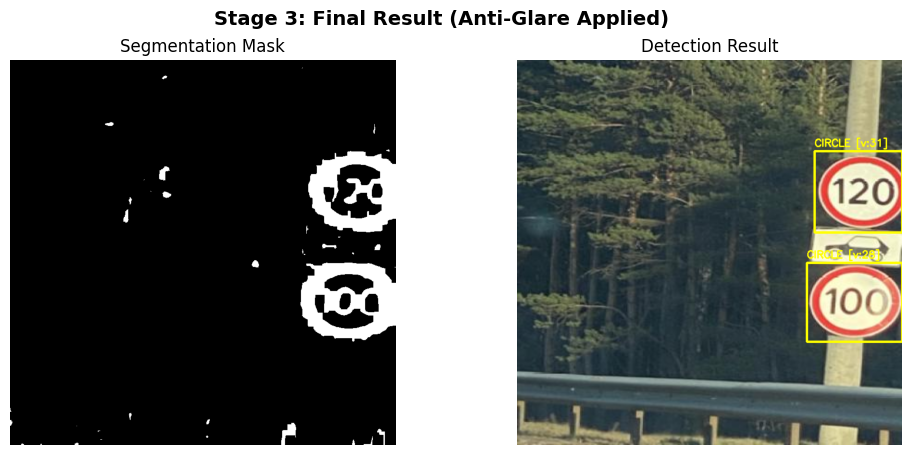

In [ ]:
import numpy as np

# --- Helper Function for Visualization ---
def show_result(title, mask, result_img):
    plt.figure(figsize=(12, 5))
    plt.suptitle(title, fontsize=14, fontweight='bold')
    
    plt.subplot(1, 2, 1)
    plt.imshow(mask, cmap='gray')
    plt.title("Segmentation Mask")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(result_img)
    plt.title("Detection Result")
    plt.axis('off')
    
    plt.show()


# STAGE 1: Baseline (Naive) - Coarse Approximation

def stage_1_initial(img_path):
    print("--- Running Stage 1: Baseline (Your Pipeline / Octagon Error) ---")
    
    img = cv2.imread(img_path)

  
    img = cv2.resize(img, (800, 800))
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 1) Pre-processing
    blurred = cv2.GaussianBlur(img, (5, 5), 0)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)

    # 2) Color segmentation (Strict red thresholds)
    lower1 = np.array([0, 70, 50]);   upper1 = np.array([10, 255, 255])
    lower2 = np.array([170, 70, 50]); upper2 = np.array([180, 255, 255])
    mask = cv2.bitwise_or(cv2.inRange(hsv, lower1, upper1),
                          cv2.inRange(hsv, lower2, upper2))

    # 3) Morphological cleanup (Opening)
    kernel = np.ones((3,3), np.uint8)
    mask_cleaned = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)

    # 4) Contours + geometric approximation
    contours, _ = cv2.findContours(mask_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    output = img_rgb.copy()

    for cnt in contours:
        area = cv2.contourArea(cnt)
 
        if area > 2000:
            perimeter = cv2.arcLength(cnt, True)

            epsilon = 0.015 * perimeter
            approx = cv2.approxPolyDP(cnt, epsilon, True)
            vertices = len(approx)

            x, y, w, h = cv2.boundingRect(cnt)
            aspect_ratio = float(w)/h

            label = ""
            if 7 <= vertices <= 9:
                label = "STOP (Octagon)"      
                color = (255, 0, 0)
            elif vertices >= 10 and 0.8 < aspect_ratio < 1.2:
                label = "CIRCLE"
                color = (255, 255, 0)

            if label:
                cv2.rectangle(output, (x, y), (x+w, y+h), color, 3)
                cv2.putText(output, f"{label} [v:{vertices}]",
                            (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    show_result("Stage 1: Baseline (Coarse Approximation -> Octagon Error)", mask_cleaned, output)


# STAGE 2: Geometric Refinement
# Improvement: Upscaling & High sensitivity (epsilon)
# Outcome: 120 limit fixed, but 100 limit lost due to sun glare

def stage_2_geometric_refinement(img_path):
    print("--- Running Stage 2: Geometric Refinement ---")
    img = cv2.imread(img_path)
    
    # FIX 1: Upscale image to improve contour smoothness
    img = cv2.resize(img, (800, 800)) 
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    blurred = cv2.GaussianBlur(img, (5, 5), 0)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
    
    # Same Strict Thresholds as Stage 1
    lower1 = np.array([0, 70, 50]); upper1 = np.array([10, 255, 255])
    lower2 = np.array([170, 70, 50]); upper2 = np.array([180, 255, 255])
    mask = cv2.bitwise_or(cv2.inRange(hsv, lower1, upper1), cv2.inRange(hsv, lower2, upper2))
    
    # Still using Opening (Issue for broken rings)
    kernel = np.ones((3,3), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    output = img_rgb.copy()
    
    for cnt in contours:
        if cv2.contourArea(cnt) > 1000:
            perimeter = cv2.arcLength(cnt, True)
            
            # FIX 2: High sensitivity (0.005) detects curvature better
            epsilon = 0.005 * perimeter
            approx = cv2.approxPolyDP(cnt, epsilon, True)
            vertices = len(approx)
            
            x, y, w, h = cv2.boundingRect(cnt)
            aspect_ratio = float(w)/h
            
            label = ""
            # Improved Logic
            if 7 <= vertices <= 9:
                label = "STOP"
                color = (255, 0, 0)
            elif vertices >= 10 and 0.8 < aspect_ratio < 1.2:
                label = "CIRCLE"
                color = (255, 255, 0)
            
            if label:
                cv2.rectangle(output, (x, y), (x+w, y+h), color, 3)
                cv2.putText(output, f"{label} [v:{vertices}]", (x, y-10), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    show_result("Stage 2: Improved Geometry (Glare Issue Remains)", mask, output)



# STAGE 3: Final Solution (Anti-Glare)
# Improvement: Relaxed HSV thresholds & Morphological Closing
# Outcome: Both signs detected correctly

def stage_3_final_solution(img_path):
    print("--- Running Stage 3: Final Anti-Glare Solution ---")
    img = cv2.imread(img_path)
    img = cv2.resize(img, (800, 800))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    blurred = cv2.GaussianBlur(img, (7, 7), 0)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
    
    # FIX 3: Relaxed Thresholds for Sun Glare
    # Lower Saturation/Value to detect washed-out red
    lower1 = np.array([0, 20, 20]); upper1 = np.array([20, 255, 255])
    lower2 = np.array([160, 20, 20]); upper2 = np.array([180, 255, 255])
    mask = cv2.bitwise_or(cv2.inRange(hsv, lower1, upper1), cv2.inRange(hsv, lower2, upper2))
    
    # FIX 4: Morphological CLOSING to bridge gaps in broken rings
    kernel = np.ones((7,7), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    output = img_rgb.copy()
    
    for cnt in contours:
        if cv2.contourArea(cnt) > 1000:
            perimeter = cv2.arcLength(cnt, True)
            epsilon = 0.005 * perimeter # Keep high sensitivity
            approx = cv2.approxPolyDP(cnt, epsilon, True)
            vertices = len(approx)
            
            x, y, w, h = cv2.boundingRect(cnt)
            aspect_ratio = float(w)/h
            
            label = ""
            if 7 <= vertices <= 9:
                label = "STOP"
                color = (255, 0, 0)
            elif vertices >= 10 and 0.7 < aspect_ratio < 1.3:
                label = "CIRCLE"
                color = (255, 255, 0)
            
            if label:
                cv2.rectangle(output, (x, y), (x+w, y+h), color, 3)
                cv2.putText(output, f"{label} [v:{vertices}]", (x, y-10), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    show_result("Stage 3: Final Result (Anti-Glare Applied)", mask, output)


# --- MAIN EXECUTION ---
if __name__ == "__main__":
    # Use the challenging image
    test_img = r"signdata/car/test/images/road747_png.rf.66031af78137deac5c6878292d9ce7db.jpg"
    
    if os.path.exists(test_img):
        # Run sequentially to show evolution
        stage_1_initial(test_img)
        stage_2_geometric_refinement(test_img)
        stage_3_final_solution(test_img)
   

Analysis Complete. Detected objects: ['SPEED LIMIT (Circle)', 'SPEED LIMIT (Circle)']


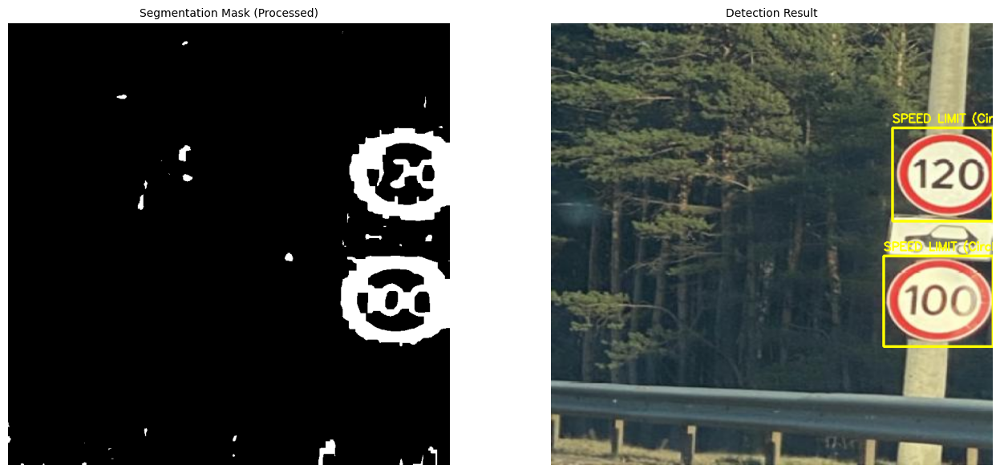

In [11]:
def process_image(img_path):
    """
    Main pipeline: Pre-processing -> Segmentation -> Feature Extraction -> Classification.
    """
    if not os.path.exists(img_path):
        print(f"Error: File not found at {img_path}")
        return

    # --- 1. Acquisition & Pre-processing ---
    raw_img = cv2.imread(img_path)
    
    # Upscale image to improve contour resolution on distant signs
    # 800x800 provides enough pixel density for shape analysis
    img = cv2.resize(raw_img, (800, 800))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Apply Gaussian Blur to suppress high-frequency noise
    blurred = cv2.GaussianBlur(img, (7, 7), 0)

    # Convert to HSV for robust color segmentation (lighting invariant)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)

    # --- 2. Color Segmentation (ROI Extraction) ---
    # We use relaxed thresholds to account for sun glare and faded paint.
    # Lower saturation/value limits allow detection of "washed out" red.
    
    # Lower red range (0-20)
    lower_red1 = np.array([0, 20, 20])
    upper_red1 = np.array([20, 255, 255])
    
    # Upper red range (160-180)
    lower_red2 = np.array([160, 20, 20])
    upper_red2 = np.array([180, 255, 255])

    # Combine masks
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    mask = cv2.bitwise_or(mask1, mask2)

    # --- 3. Morphological Operations ---
    # Use 'Closing' to bridge gaps in contours caused by reflections
    kernel = np.ones((7, 7), np.uint8)
    mask_cleaned = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # --- 4. Feature Extraction & Classification ---
    contours, _ = cv2.findContours(mask_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    output_img = img_rgb.copy()
    detections = []

    for cnt in contours:
        area = cv2.contourArea(cnt)
        
        # Filter out small noise and massive blobs (sky/ground errors)
        if 1000 < area < 150000:
            perimeter = cv2.arcLength(cnt, True)
            
            # Approximation accuracy (epsilon).
            # 0.005 is highly sensitive, preserving curvature for circle detection.
            epsilon = 0.005 * perimeter
            approx = cv2.approxPolyDP(cnt, epsilon, True)
            vertices = len(approx)
            
            x, y, w, h = cv2.boundingRect(cnt)
            aspect_ratio = float(w) / h
            
            label = ""
            color = (0, 255, 0) # Default green

            # -- Classification Logic --
            
            # Octagon -> STOP Sign (vertices usually drop to 7-9 due to pixelation)
            if 7 <= vertices <= 9:
                label = "STOP (Octagon)"
                color = (255, 0, 0) # Red bounding box
            
            # High vertex count + Square-ish ratio -> Speed Limit (Circle)
            elif vertices >= 10 and 0.7 < aspect_ratio < 1.3:
                label = "SPEED LIMIT (Circle)"
                color = (255, 255, 0) # Yellow bounding box
            
            # Triangle -> Warning Sign
            elif vertices == 3:
                label = "WARNING (Triangle)"
            
            if label:
                detections.append(label)
                # Draw bounding box and label
                cv2.rectangle(output_img, (x, y), (x + w, y + h), color, 3)
                text = f"{label} [v:{vertices}]"
                cv2.putText(output_img, text, (x, y - 10), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    return mask_cleaned, output_img, detections

def visualize_results(mask, result, title="Detection Result"):
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(mask, cmap='gray')
    plt.title("Segmentation Mask (Processed)", fontsize=10)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.title(title, fontsize=10)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Test on a specific challenging image (Glare + Multiple signs)
    # Update this path to point to your target image
    test_img = r"signdata/car/test/images/road747_png.rf.66031af78137deac5c6878292d9ce7db.jpg"
    
    processed_mask, final_result, found_labels = process_image(test_img)
    
    print(f"Analysis Complete. Detected objects: {found_labels}")
    visualize_results(processed_mask, final_result)


--- Comprehensive Analysis Results ---
>> Detected: MANDATORY (Circle) | Color: BLUE | Vertices: 11
>> Detected: MANDATORY (Circle) | Color: BLUE | Vertices: 12
>> Detected: MANDATORY (Circle) | Color: BLUE | Vertices: 16
>> Detected: SPEED LIMIT (Circle) | Color: RED | Vertices: 13
>> Detected: MANDATORY (Circle) | Color: BLUE | Vertices: 16
>> Detected: SPEED LIMIT (Circle) | Color: RED | Vertices: 10


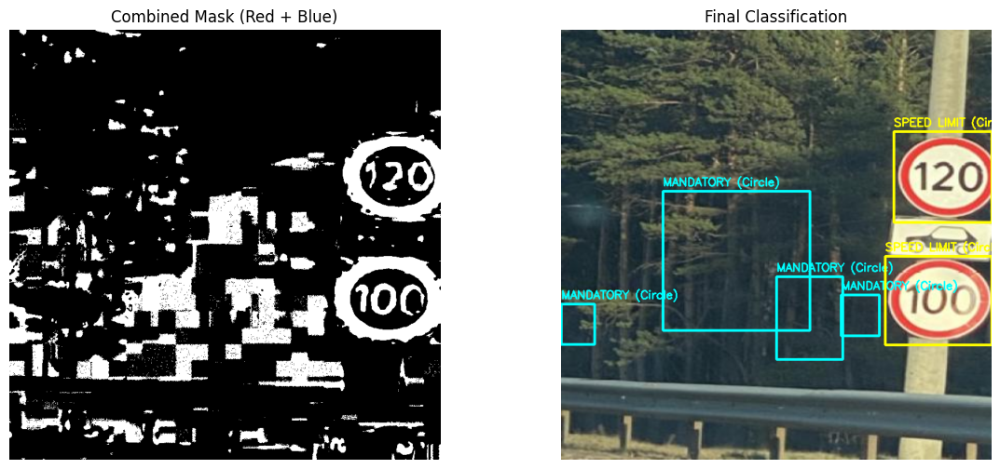

In [12]:

# Target image path
img_path = r"D:\vscode_calisma\imgproject\RoadRunner-main\signdata\car\test\images\road747_png.rf.66031af78137deac5c6878292d9ce7db.jpg"

def get_dominant_color(roi_mask_red, roi_mask_blue):
    """
    Helper to decide if the detected object is Red or Blue based on mask pixel count.
    """
    red_pixels = cv2.countNonZero(roi_mask_red)
    blue_pixels = cv2.countNonZero(roi_mask_blue)
    
    if red_pixels > blue_pixels:
        return "RED"
    elif blue_pixels > red_pixels:
        return "BLUE"
    return "UNKNOWN"

def comprehensive_dip_analysis(path):
    if not os.path.exists(path):
        print(f"File not found: {path}")
        return

    # 1. Pre-processing
    img = cv2.imread(path)
    # Resize for consistent contour detection
    img = cv2.resize(img, (800, 800)) 
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    blurred = cv2.GaussianBlur(img, (5, 5), 0)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
    
    # 2. Color Segmentation
    
    # --- RED MASKS (Stop, Speed Limit, Warning) ---
    lower_red1 = np.array([0, 20, 20]);   upper_red1 = np.array([20, 255, 255])
    lower_red2 = np.array([160, 20, 20]); upper_red2 = np.array([180, 255, 255])
    mask_r1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask_r2 = cv2.inRange(hsv, lower_red2, upper_red2)
    mask_red = cv2.bitwise_or(mask_r1, mask_r2)
    
    # --- BLUE MASK (Information, Mandatory Direction) ---
    # Blue is typically around 100-130 in HSV
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([130, 255, 255])
    mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)
    
    # Combine both for shape analysis
    combined_mask = cv2.bitwise_or(mask_red, mask_blue)
    
    # 3. Morphology (Clean up noise)
    kernel = np.ones((3,3), np.uint8)
    # Closing is better here to keep blue squares solid
    mask_cleaned = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    # 4. Feature Extraction
    contours, _ = cv2.findContours(mask_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    output_img = img_rgb.copy()
    
    print(f"\n--- Comprehensive Analysis Results ---")
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        
        # Filter small noise
        if area > 2000: 
            perimeter = cv2.arcLength(cnt, True)
            epsilon = 0.015 * perimeter 
            approx = cv2.approxPolyDP(cnt, epsilon, True)
            vertices = len(approx)
            
            x, y, w, h = cv2.boundingRect(cnt)
            aspect_ratio = float(w)/h
            
            # Identify Color Source (Is this shape sitting on the Red or Blue mask?)
            # We crop the area from both masks to check which one is active
            roi_r = mask_red[y:y+h, x:x+w]
            roi_b = mask_blue[y:y+h, x:x+w]
            color_type = get_dominant_color(roi_r, roi_b)
            
            label = ""
            box_color = (0, 255, 0) # Green default
            
            # --- Logic Tree (Shape + Color) ---
            
            # TRIANGLE (3 vertices)
            if vertices == 3:
                if color_type == "RED":
                    label = "WARNING (Triangle)"
                    box_color = (255, 165, 0) # Orange
            
            # RECTANGLE / SQUARE (4 vertices)
            elif vertices == 4:
                # Rectangles are usually Blue (Info) or White/Yellow (not handled here)
                if 0.8 < aspect_ratio < 1.2:
                    if color_type == "BLUE":
                        label = "INFO (Square)"
                        box_color = (0, 0, 255) # Blue
                else:
                    if color_type == "BLUE":
                        label = "DIRECTION (Rect)"
                        box_color = (0, 0, 255)
            
            # OCTAGON (7-9 vertices)
            elif 7 <= vertices <= 9:
                if color_type == "RED":
                    label = "STOP (Octagon)"
                    box_color = (255, 0, 0) # Red
            
            # CIRCLE (10+ vertices)
            elif vertices >= 10 and 0.7 < aspect_ratio < 1.3:
                if color_type == "RED":
                    label = "SPEED LIMIT (Circle)"
                    box_color = (255, 255, 0) # Yellow
                elif color_type == "BLUE":
                    label = "MANDATORY (Circle)" # e.g. Turn Right
                    box_color = (0, 255, 255) # Cyan

            if label:
                print(f">> Detected: {label} | Color: {color_type} | Vertices: {vertices}")
                cv2.rectangle(output_img, (x, y), (x+w, y+h), box_color, 3)
                cv2.putText(output_img, label, (x, y-10), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, box_color, 2)
    
    # 5. Visualization
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(combined_mask, cmap='gray')
    plt.title("Combined Mask (Red + Blue)")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(output_img)
    plt.title("Final Classification")
    plt.axis('off')
    
    plt.show()

# Run
comprehensive_dip_analysis(img_path)

Car detect

[INFO] Loading MobileNet-SSD model...
Vehicles detected: 0


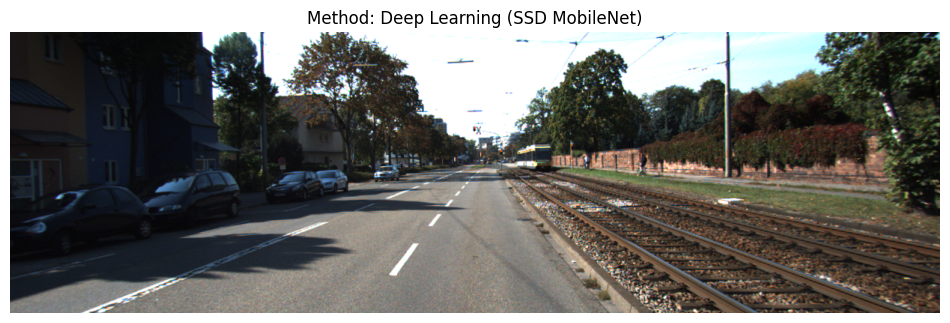

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import urllib.request

class SSDCarDetector:
    """
    A wrapper class for OpenCV's DNN module using the MobileNet-SSD model.
    Advantage: No heavy libraries like PyTorch/TensorFlow required.
    Method: Single Shot Detector (SSD) with a MobileNet backbone.
    """
    
    def __init__(self, confidence=0.4):
        self.conf_threshold = confidence
        
        # Files required for the Caffe model
        self.proto_file = "deploy.prototxt"
        self.weights_file = "mobilenet_iter_73000.caffemodel"
        
        # Auto-download weights if they don't exist locally
        self.download_models()
        
        print("[INFO] Loading MobileNet-SSD model...")
        # Load the network using OpenCV's DNN module
        self.net = cv2.dnn.readNetFromCaffe(self.proto_file, self.weights_file)
        
        # MobileNet-SSD Class IDs: 6 -> Bus, 7 -> Car
        self.target_class_ids = [6, 7] 

    def download_models(self):
        """Fetches the model architecture and pre-trained weights from GitHub."""
        base_url = "https://raw.githubusercontent.com/chuanqi305/MobileNet-SSD/master/"
        
        if not os.path.exists(self.proto_file):
            print("Downloading config file (prototxt)...")
            urllib.request.urlretrieve(base_url + "deploy.prototxt", self.proto_file)
            
        if not os.path.exists(self.weights_file):
            print("Downloading pre-trained weights (caffemodel)...")
            # This file is roughly 22MB
            url_weights = "https://github.com/chuanqi305/MobileNet-SSD/raw/master/mobilenet_iter_73000.caffemodel"
            urllib.request.urlretrieve(url_weights, self.weights_file)

    def detect_cars(self, image):
        """
        Runs the forward pass on the image to detect objects.
        Returns a list of tuples: (x, y, w, h, label, confidence)
        """
        (h, w) = image.shape[:2]
        
        # Pre-process the image: resize to 300x300, mean subtraction (127.5), and scaling
        blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)
        
        self.net.setInput(blob)
        detections = self.net.forward()
        
        found_objects = []
        
        # Iterate through all detections
        for i in range(detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            
            # Filter out weak detections
            if confidence > self.conf_threshold:
                class_id = int(detections[0, 0, i, 1])
                
                # We only care about Cars (7) or Buses (6)
                if class_id in self.target_class_ids:
                    # Calculate bounding box coordinates relative to the original image
                    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                    (startX, startY, endX, endY) = box.astype("int")
                    
                    label_text = "Car" if class_id == 7 else "Bus"
                    
                    # Store result
                    found_objects.append((startX, startY, endX - startX, endY - startY, label_text, confidence))
                    
        return found_objects

    def draw_detections(self, image, detections):
        """Draws bounding boxes and labels on the image."""
        result_img = image.copy()
        
        for (x, y, w, h, label, conf) in detections:
            # Draw the bounding box
            cv2.rectangle(result_img, (x, y), (x + w, y + h), (255, 0, 0), 2)
            
            # Prepare the label text
            text = f"{label}: {conf:.2f}"
            
            # Adjust label position so it doesn't go off-screen
            y_pos = y - 15 if y - 15 > 15 else y + 15
            
            cv2.putText(result_img, text, (x, y_pos),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
                        
        return result_img

# --- MAIN EXECUTION BLOCK ---
if __name__ == "__main__":
    # Define the path to your test image
    image_path = os.path.join("data_road", "data_road", "training", "image_2", "umm_000000.png")

    if os.path.exists(image_path):
        img = cv2.imread(image_path)
        
        # Initialize the detector
        # Confidence 0.3 is usually a good balance for this model
        detector = SSDCarDetector(confidence=0.3)
        
        # Run detection
        detected_vehicles = detector.detect_cars(img)
        print(f"Vehicles detected: {len(detected_vehicles)}")
        
        # Visualize results
        final_output = detector.draw_detections(img, detected_vehicles)
        
        plt.figure(figsize=(12, 8))
        # Convert BGR to RGB for Matplotlib
        plt.imshow(cv2.cvtColor(final_output, cv2.COLOR_BGR2RGB))
        plt.title("Method: Deep Learning (SSD MobileNet)")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Image not found at {image_path}")

[INFO] Loading Haar Cascade Classifier...
[RESULT] Detected 2 vehicles via Haar Cascade.


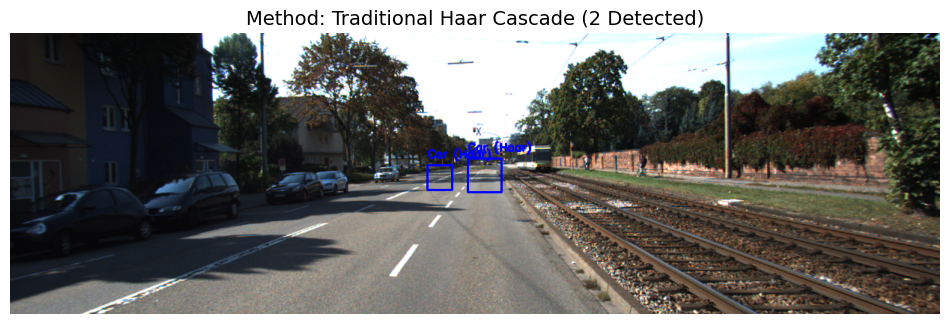

In [16]:
import cv2
import matplotlib.pyplot as plt
import os
import urllib.request

class HaarCarDetector:
    """
    Implements vehicle detection using the traditional Haar Cascade Classifier.
    Method: Feature-based cascade classifier (Viola-Jones framework).
    Pros: Fast on CPU, lightweight.
    Cons: High False Positive rate, sensitive to scale/lighting.
    """

    def __init__(self, xml_path='haarcascade_car.xml'):
        self.xml_path = xml_path
        self.model_url = "https://raw.githubusercontent.com/andrewssobral/vehicle_detection_haarcascades/master/cars.xml"
        
        # Ensure the model file exists locally
        self._check_and_download_model()
        
        print("[INFO] Loading Haar Cascade Classifier...")
        self.classifier = cv2.CascadeClassifier(self.xml_path)

    def _check_and_download_model(self):
        """Checks for the XML file and downloads it if missing."""
        if not os.path.exists(self.xml_path):
            print(f"Model file not found. Downloading from {self.model_url}...")
            urllib.request.urlretrieve(self.model_url, self.xml_path)

    def detect(self, image_path, scale_factor=1.1, min_neighbors=3):
        """
        Performs detection on the provided image.
        
        Args:
            scale_factor (float): How much the image size is reduced at each image scale.
            min_neighbors (int): How many neighbors each candidate rectangle should have to retain it.
        """
        if not os.path.exists(image_path):
            print(f"[ERROR] Image not found: {image_path}")
            return None, []

        # 1. Image Acquisition
        img = cv2.imread(image_path)
        
        # 2. Pre-processing: Grayscale Conversion
        # Haar Cascades work on intensity differences, color information is redundant.
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # 3. Detection (Multi-scale Sliding Window)
        # This function detects objects of different sizes in the input image.
        cars = self.classifier.detectMultiScale(gray, scaleFactor=scale_factor, minNeighbors=min_neighbors)
        
        print(f"[RESULT] Detected {len(cars)} vehicles via Haar Cascade.")
        return img, cars

    def visualize(self, img, detections):
        """Draws bounding boxes and displays the result using Matplotlib."""
        output_img = img.copy()
        
        for (x, y, w, h) in detections:
            # Draw rectangle (Blue color in BGR)
            cv2.rectangle(output_img, (x, y), (x+w, y+h), (255, 0, 0), 2)
            # Add label
            cv2.putText(output_img, 'Car (Haar)', (x, y-10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        # Convert BGR to RGB for correct display in Matplotlib
        output_img = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(12, 8))
        plt.imshow(output_img)
        plt.title(f"Method: Traditional Haar Cascade ({len(detections)} Detected)", fontsize=14)
        plt.axis('off')
        plt.show()

# --- MAIN EXECUTION ---
if __name__ == "__main__":
    # Define test image path
    img_path = os.path.join("data_road", "data_road", "training", "image_2", "umm_000000.png")
    
    detector = HaarCarDetector()
    
    # Run detection
    # Note: min_neighbors can be increased (e.g., 4 or 5) to reduce false positives
    original_img, results = detector.detect(img_path, scale_factor=1.1, min_neighbors=3)
    
    if original_img is not None:
        detector.visualize(original_img, results)

[INFO] Loading MobileNet-SSD model...
[RESULT] SSD MobileNet detected 2 vehicles.


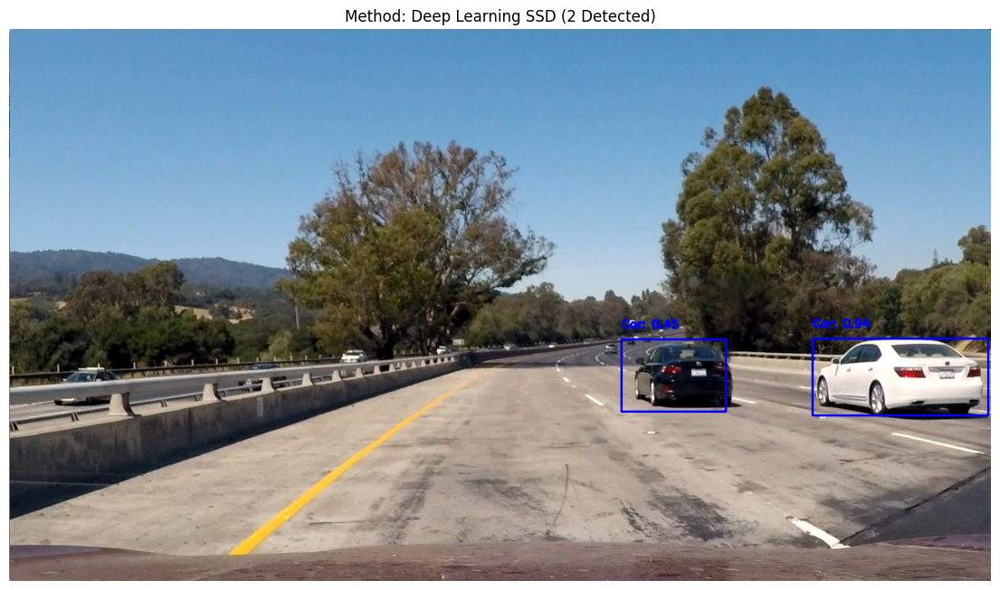

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import urllib.request

class SSDVehicleDetector:
    """
    Implements vehicle detection using a Single Shot Detector (SSD) with a MobileNet backbone.
    Leverages OpenCV's Deep Neural Network (DNN) module for inference.
    
    Pros: Better accuracy than Haar Cascades, robust to object scale.
    Cons: Slightly slower than Haar Cascades on CPU, but faster than typical CNNs.
    """

    def __init__(self, confidence=0.3):
        # Confidence threshold to filter out weak detections
        self.conf_threshold = confidence
        
        # Model configuration (architecture) and weights (learned parameters)
        self.proto_file = "deploy.prototxt"
        self.weights_file = "mobilenet_iter_73000.caffemodel"
        
        # Ensure model assets are available locally
        self._download_models()
        
        print("[INFO] Loading MobileNet-SSD model...")
        self.net = cv2.dnn.readNetFromCaffe(self.proto_file, self.weights_file)
        
        # Class IDs for vehicles in the VOC dataset (6: Bus, 7: Car)
        self.vehicle_class_ids = [6, 7] 

    def _download_models(self):
        """Downloads model architecture and weights if not present."""
        base_url = "https://raw.githubusercontent.com/chuanqi305/MobileNet-SSD/master/"
        
        if not os.path.exists(self.proto_file):
            print("Downloading model configuration (prototxt)...")
            urllib.request.urlretrieve(base_url + "deploy.prototxt", self.proto_file)
            
        if not os.path.exists(self.weights_file):
            print("Downloading model weights (caffemodel)...")
            url_weights = "https://github.com/chuanqi305/MobileNet-SSD/raw/master/mobilenet_iter_73000.caffemodel"
            urllib.request.urlretrieve(url_weights, self.weights_file)

    def detect(self, image):
        """
        Performs a forward pass on the neural network to detect vehicles.
        Returns a list of detections: (x, y, w, h, label, confidence)
        """
        (h, w) = image.shape[:2]
        
        # Preprocessing: 
        # 1. Resize to 300x300 (fixed input size for SSD)
        # 2. Mean subtraction (127.5) to normalize pixel intensity
        blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)
        
        self.net.setInput(blob)
        detections = self.net.forward()
        
        found_vehicles = []
        
        # Iterate over all detections provided by the network
        for i in range(detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            
            # Filter weak predictions based on confidence threshold
            if confidence > self.conf_threshold:
                class_id = int(detections[0, 0, i, 1])
                
                # Check if the detected object is a Car (7) or Bus (6)
                if class_id in self.vehicle_class_ids:
                    # Scale bounding box coordinates back to the original image size
                    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                    (start_x, start_y, end_x, end_y) = box.astype("int")
                    
                    label = "Car" if class_id == 7 else "Bus"
                    
                    found_vehicles.append((start_x, start_y, end_x - start_x, end_y - start_y, label, confidence))
                    
        return found_vehicles

    def visualize(self, image, detections):
        """Draws bounding boxes and labels on the image."""
        output_img = image.copy()
        
        for (x, y, w, h, label, conf) in detections:
            # Draw rectangle (Using Blue to distinguish from Haar results)
            cv2.rectangle(output_img, (x, y), (x + w, y + h), (255, 0, 0), 2)
            
            text = f"{label}: {conf:.2f}"
            
            # Adjust label position to ensure it stays within image boundaries
            y_pos = y - 15 if y - 15 > 15 else y + 15
            
            cv2.putText(output_img, text, (x, y_pos), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
                        
        return output_img

# --- MAIN EXECUTION ---
if __name__ == "__main__":
    # Define test image filename
    test_image_name = "test1.jpg"
    
    # Download sample test image if missing
    if not os.path.exists(test_image_name):
        print("Downloading sample test image...")
        url = "https://raw.githubusercontent.com/udacity/CarND-Vehicle-Detection/master/test_images/test1.jpg"
        urllib.request.urlretrieve(url, test_image_name)

    img = cv2.imread(test_image_name)

    if img is not None:
        # Initialize detector with a moderate confidence threshold
        detector = SSDVehicleDetector(confidence=0.3)
        
        # Run detection
        vehicles = detector.detect(img)
        print(f"[RESULT] SSD MobileNet detected {len(vehicles)} vehicles.")
        
        # Visualize results
        result_img = detector.visualize(img, vehicles)
        
        # Display using Matplotlib
        plt.figure(figsize=(14, 10))
        plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Method: Deep Learning SSD ({len(vehicles)} Detected)")
        plt.axis('off')
        plt.show()
    else:
        print(f"[ERROR] Could not read image: {test_image_name}")

[INFO] Loading YOLOv8 model (yolov8n.pt)...
[INFO] Running inference...
[RESULT] Detected 6 vehicles.


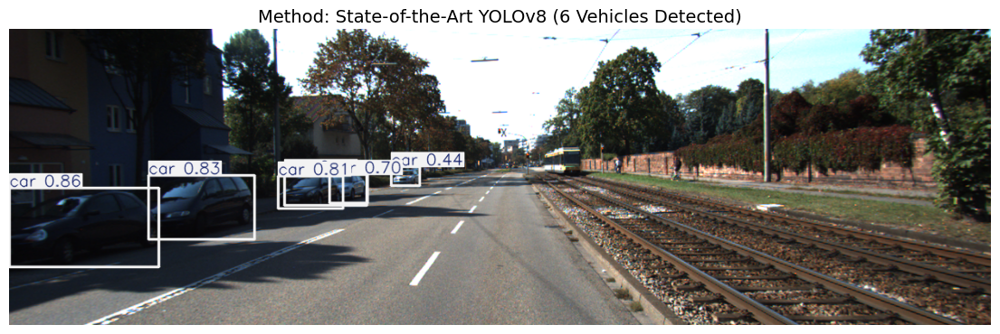

In [19]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os

class YOLOv8Detector:
    """
    Implements vehicle detection using the YOLOv8 (You Only Look Once - Version 8) architecture.
    
    Architecture: Anchor-free, single-stage object detection.
    Pros: State-of-the-art accuracy and real-time speed.
    Cons: Requires more memory/GPU than Haar Cascades.
    """

    def __init__(self, model_weight='yolov8n.pt'):
        """
        Initializes the YOLOv8 model.
        Args:
            model_weight (str): Path to the model weight file. 'yolov8n.pt' is the "nano" version (fastest).
        """
        print(f"[INFO] Loading YOLOv8 model ({model_weight})...")
        # The library automatically downloads the weight file if not found locally.
        self.model = YOLO(model_weight)
        
        # COCO Dataset Class IDs for vehicles:
        # 2: Car, 3: Motorcycle, 5: Bus, 7: Truck
        self.target_classes = [2, 3, 5, 7]

    def detect(self, image_path):
        """
        Performs inference on the image.
        Returns the result object containing boxes, masks, and probabilities.
        """
        if not os.path.exists(image_path):
            print(f"[ERROR] Image not found at {image_path}")
            return None

        print("[INFO] Running inference...")
        # classes=... argument filters the detection to only specific objects (vehicles)
        # verbose=False keeps the console output clean
        results = self.model.predict(source=image_path, classes=self.target_classes, verbose=False)
        
        # results is a list (one for each image), we only processed one image.
        return results[0]

    def visualize(self, result_object):
        """
        Uses YOLOv8's built-in plotting utility to visualize detections.
        """
        # .plot() returns a BGR numpy array with boxes drawn
        annotated_frame = result_object.plot()
        
        # Convert BGR to RGB for Matplotlib display
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
        
        count = len(result_object.boxes)
        
        plt.figure(figsize=(14, 10))
        plt.imshow(rgb_frame)
        plt.title(f"Method: State-of-the-Art YOLOv8 ({count} Vehicles Detected)", fontsize=14)
        plt.axis('off')
        plt.show()

# --- MAIN EXECUTION ---
if __name__ == "__main__":
    # Define test image path
    img_path = os.path.join("data_road", "data_road", "training", "image_2", "umm_000000.png")
    
    # Initialize detector
    # 'yolov8n.pt' is the Nano model. For higher accuracy (but slower speed), use 'yolov8s.pt' or 'yolov8m.pt'.
    detector = YOLOv8Detector(model_weight='yolov8n.pt')
    
    # Run detection
    result = detector.detect(img_path)
    
    if result is not None:
        print(f"[RESULT] Detected {len(result.boxes)} vehicles.")
        detector.visualize(result)

[INFO] Initializing YOLOv8 model: yolov8n.pt
[INFO] Found 289 images in directory.


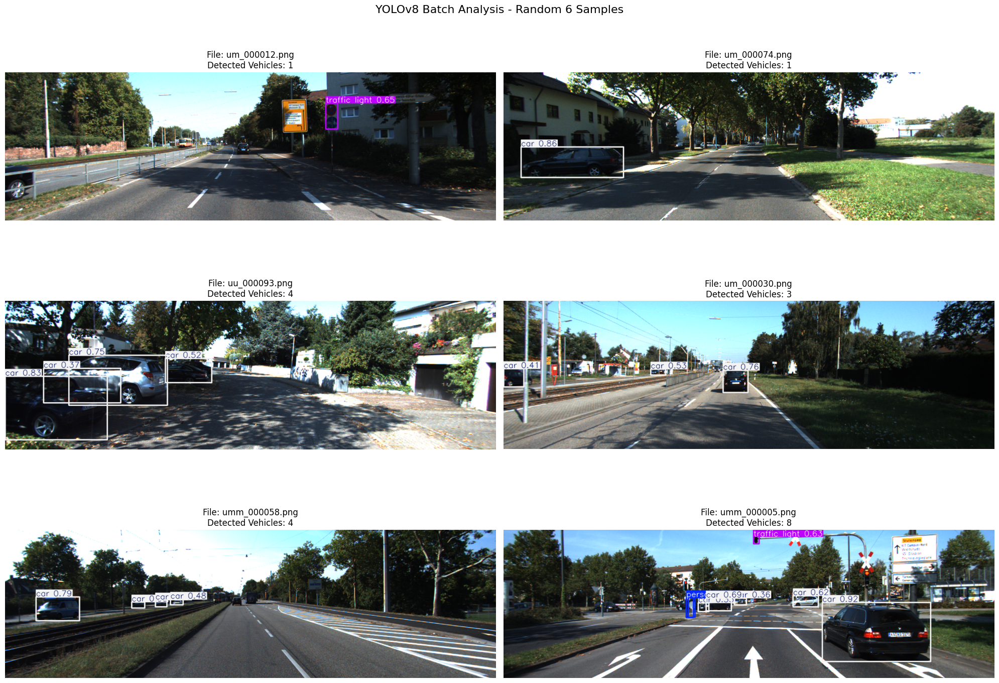

In [23]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os
import glob
import random

class YOLOBatchAnalyzer:
    """
    A utility class to perform batch testing on a dataset using YOLOv8.
    
    Purpose: To validate the model's robustness by testing it on random samples 
    rather than a single selected image.
    """

    def __init__(self, model_path='yolov8n.pt'):
        """
        Initializes the YOLO model.
        """
        print(f"[INFO] Initializing YOLOv8 model: {model_path}")
        self.model = YOLO(model_path)

    def select_random_images(self, source_folder, count=6):
        """
        Scans the target directory and selects random images for testing.
        Args:
            source_folder (str): Path to the image directory.
            count (int): Number of images to select.
        Returns:
            list: List of file paths.
        """
        # Look for common image extensions
        extensions = ['*.png', '*.jpg', '*.jpeg']
        all_files = []
        
        for ext in extensions:
            all_files.extend(glob.glob(os.path.join(source_folder, ext)))
        
        total_files = len(all_files)
        print(f"[INFO] Found {total_files} images in directory.")
        
        if total_files < count:
            print(f"[WARNING] Not enough images for batch size {count}. Using all available.")
            return all_files
            
        # Random sampling to avoid selection bias
        return random.sample(all_files, count)

    def run_batch_test(self, image_paths):
        """
        Runs inference on the selected batch and visualizes the results in a grid.
        """
        if not image_paths:
            print("[ERROR] No images to process.")
            return

        plt.figure(figsize=(20, 15))
        plt.suptitle(f"YOLOv8 Batch Analysis - Random {len(image_paths)} Samples", fontsize=16)

        for i, img_path in enumerate(image_paths):
            # 1. Inference
            # verbose=False suppresses the console log for cleaner output
            results = self.model(img_path, verbose=False)
            
            # 2. Annotation
            # .plot() draws the bounding boxes and labels onto the image
            annotated_frame = results[0].plot()
            
            # 3. Color Conversion (BGR to RGB for Matplotlib)
            rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
            
            # 4. Grid Plotting
            # Create a subplot grid (dynamic based on count, assuming 2 columns)
            cols = 2
            rows = (len(image_paths) + 1) // cols
            
            plt.subplot(rows, cols, i + 1)
            file_name = os.path.basename(img_path)
            vehicle_count = len(results[0].boxes)
            
            plt.imshow(rgb_frame)
            plt.title(f"File: {file_name}\nDetected Vehicles: {vehicle_count}", fontsize=12)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

# --- MAIN EXECUTION ---
if __name__ == "__main__":
    # Define the dataset directory
    dataset_path = os.path.join("data_road", "data_road", "training", "image_2")
    
    if os.path.exists(dataset_path):
        # Initialize the analyzer
        analyzer = YOLOBatchAnalyzer()
        
        # Select 6 random images
        test_samples = analyzer.select_random_images(dataset_path, count=6)
        
        # Run and visualize
        analyzer.run_batch_test(test_samples)
    else:
        print(f"[ERROR] Directory not found: {dataset_path}")